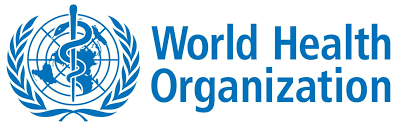

#                                                              WHO Life Expectancy Project Exploratory Data Analysis

### Importing Libraries

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

### Importing Dataset

In [3]:
df = pd.read_csv('Life Expectancy Data.csv')

# 1. EDA and Clean

### Eyeballing Data

In [4]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [5]:
df.shape

(2938, 22)

In [6]:
df.dtypes

Country                             object
Year                                 int64
Status                              object
Life expectancy                    float64
Adult Mortality                    float64
infant deaths                        int64
Alcohol                            float64
percentage expenditure             float64
Hepatitis B                        float64
Measles                              int64
 BMI                               float64
under-five deaths                    int64
Polio                              float64
Total expenditure                  float64
Diphtheria                         float64
 HIV/AIDS                          float64
GDP                                float64
Population                         float64
 thinness  1-19 years              float64
 thinness 5-9 years                float64
Income composition of resources    float64
Schooling                          float64
dtype: object

###### Columns have strange spaces, will strip these now for ease of use

In [7]:
df.columns = df.columns.str.strip()

## Checking for Nulls

In [8]:
null_df = df.isnull() # truth table
null_df.sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
BMI                                 34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
HIV/AIDS                             0
GDP                                448
Population                         652
thinness  1-19 years                34
thinness 5-9 years                  34
Income composition of resources    167
Schooling                          163
dtype: int64

### Life Expectancy Nulls

In [9]:
df.loc[df['Life expectancy'].isnull()]

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
624,Cook Islands,2013,Developing,NaN,NaN,0,0.01,0.000000,98.0,0,...,98.0,3.58,98.0,0.1,NaN,NaN,0.1,0.1,NaN,NaN
769,Dominica,2013,Developing,NaN,NaN,0,0.01,11.419555,96.0,0,...,96.0,5.58,96.0,0.1,722.756650,NaN,2.7,2.6,0.721,12.7
1650,Marshall Islands,2013,Developing,NaN,NaN,0,0.01,871.878317,8.0,0,...,79.0,17.24,79.0,0.1,3617.752354,NaN,0.1,0.1,NaN,0.0
1715,Monaco,2013,Developing,NaN,NaN,0,0.01,0.000000,99.0,0,...,99.0,4.30,99.0,0.1,NaN,NaN,NaN,NaN,NaN,NaN
1812,Nauru,2013,Developing,NaN,NaN,0,0.01,15.606596,87.0,0,...,87.0,4.65,87.0,0.1,136.183210,NaN,0.1,0.1,NaN,9.6
1909,Niue,2013,Developing,NaN,NaN,0,0.01,0.000000,99.0,0,...,99.0,7.20,99.0,0.1,NaN,NaN,0.1,0.1,NaN,NaN
1958,Palau,2013,Developing,NaN,NaN,0,NaN,344.690631,99.0,0,...,99.0,9.27,99.0,0.1,1932.122370,292.0,0.1,0.1,0.779,14.2
2167,Saint Kitts and Nevis,2013,Developing,NaN,NaN,0,8.54,0.000000,97.0,0,...,96.0,6.14,96.0,0.1,NaN,NaN,3.7,3.6,0.749,13.4
2216,San Marino,2013,Developing,NaN,NaN,0,0.01,0.000000,69.0,0,...,69.0,6.50,69.0,0.1,NaN,NaN,NaN,NaN,NaN,15.1
2713,Tuvalu,2013,Developing,NaN,NaN,0,0.01,78.281203,9.0,0,...,9.0,16.61,9.0,0.1,3542.135890,1819.0,0.2,0.1,NaN,0.0


##### These nulls were found to be all from small developing countries in the year 2013, and seemed to also be the rows with the Adult Mortality Nulls, it was decided to drop these rows from the dataset as it is a small collection and LE is crucial to this study

In [10]:
df.dropna(
    axis = 0,
    how = 'any',
    subset = ['Life expectancy'],
    inplace = True
)

In [11]:
null_df = df.isnull() # truth table
null_df.sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                      0
Adult Mortality                      0
infant deaths                        0
Alcohol                            193
percentage expenditure               0
Hepatitis B                        553
Measles                              0
BMI                                 32
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
HIV/AIDS                             0
GDP                                443
Population                         644
thinness  1-19 years                32
thinness 5-9 years                  32
Income composition of resources    160
Schooling                          160
dtype: int64

##### Population is being dropped as it is not as useful for LE and has many nulls

In [12]:
df.drop(columns='Population', inplace=True)

##### Removing remaining Polio rows as only 8

In [14]:
df.dropna(
    axis = 0, # default
    how = 'any', # default
    subset = ['Polio'],   # subset tells dropna which columns to consider
    inplace = True # makes change permanent
)

##### Dropping BMI as Incorrect

In [15]:
df.drop(columns='BMI', inplace=True)

##### Missing the Last year of Alcohol for most countries so going to fill with the mean

In [16]:
df['Alcohol'] = df.groupby('Country')[['Alcohol']].transform(lambda x: x.fillna(x.mean()))

In [17]:
null_df = df.isnull() # truth table
null_df.sum()

Country                              0
Year                                 0
Status                               0
Life expectancy                      0
Adult Mortality                      0
infant deaths                        0
Alcohol                              0
percentage expenditure               0
Hepatitis B                        525
Measles                              0
under-five deaths                    0
Polio                                0
Total expenditure                  212
Diphtheria                           0
HIV/AIDS                             0
GDP                                435
thinness  1-19 years                 0
thinness 5-9 years                   0
Income composition of resources    160
Schooling                          160
dtype: int64

### Correlation View

In [18]:
df.corr()

C:\Users\lawre\AppData\Local\Temp\ipykernel_19396\1886530979.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
Year,1.000000,0.170772,-0.080136,-0.037310,-0.047484,0.031834,0.105399,-0.083198,-0.042781,0.096300,0.086266,0.136667,-0.141273,0.102807,-0.044713,-0.047784,0.239247,0.212443
Life expectancy,0.170772,1.000000,-0.693189,-0.197408,0.407194,0.381173,0.255871,-0.160525,-0.223172,0.464166,0.215251,0.478194,-0.560382,0.460507,-0.476342,-0.470744,0.726189,0.760373
Adult Mortality,-0.080136,-0.693189,1.000000,0.078712,-0.197406,-0.241062,-0.163169,0.032587,0.093854,-0.271549,-0.112453,-0.272017,0.526784,-0.294040,0.302124,0.307695,-0.451037,-0.447893
infant deaths,-0.037310,-0.197408,0.078712,1.000000,-0.116768,-0.085716,-0.225136,0.501103,0.996635,-0.171630,-0.128895,-0.175967,0.025280,-0.108457,0.466297,0.471925,-0.149335,-0.204670
Alcohol,-0.047484,0.407194,-0.197406,-0.116768,1.000000,0.329382,0.085131,-0.054857,-0.113161,0.225322,0.306384,0.219171,-0.052501,0.351295,-0.435481,-0.424689,0.450913,0.548630
percentage expenditure,0.031834,0.381173,-0.241062,-0.085716,0.329382,1.000000,0.015830,-0.057329,-0.087828,0.146904,0.176645,0.143203,-0.098387,0.899204,-0.252621,-0.254143,0.385364,0.400079
Hepatitis B,0.105399,0.255871,-0.163169,-0.225136,0.085131,0.015830,1.000000,-0.122423,-0.234638,0.484553,0.068496,0.611706,-0.114026,0.082934,-0.122479,-0.127039,0.197257,0.220066
Measles,-0.083198,-0.160525,0.032587,0.501103,-0.054857,-0.057329,-0.122423,1.000000,0.507846,-0.137803,-0.106573,-0.143337,0.031004,-0.077104,0.224876,0.221120,-0.136878,-0.150021
under-five deaths,-0.042781,-0.223172,0.093854,0.996635,-0.113161,-0.087828,-0.234638,0.507846,1.000000,-0.189641,-0.130325,-0.196457,0.038143,-0.111976,0.468373,0.472832,-0.167384,-0.220212
Polio,0.096300,0.464166,-0.271549,-0.171630,0.225322,0.146904,0.484553,-0.137803,-0.189641,1.000000,0.140451,0.668335,-0.160840,0.211369,-0.222790,-0.223568,0.379079,0.413361


C:\Users\lawre\AppData\Local\Temp\ipykernel_19396\1154403295.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot = True)


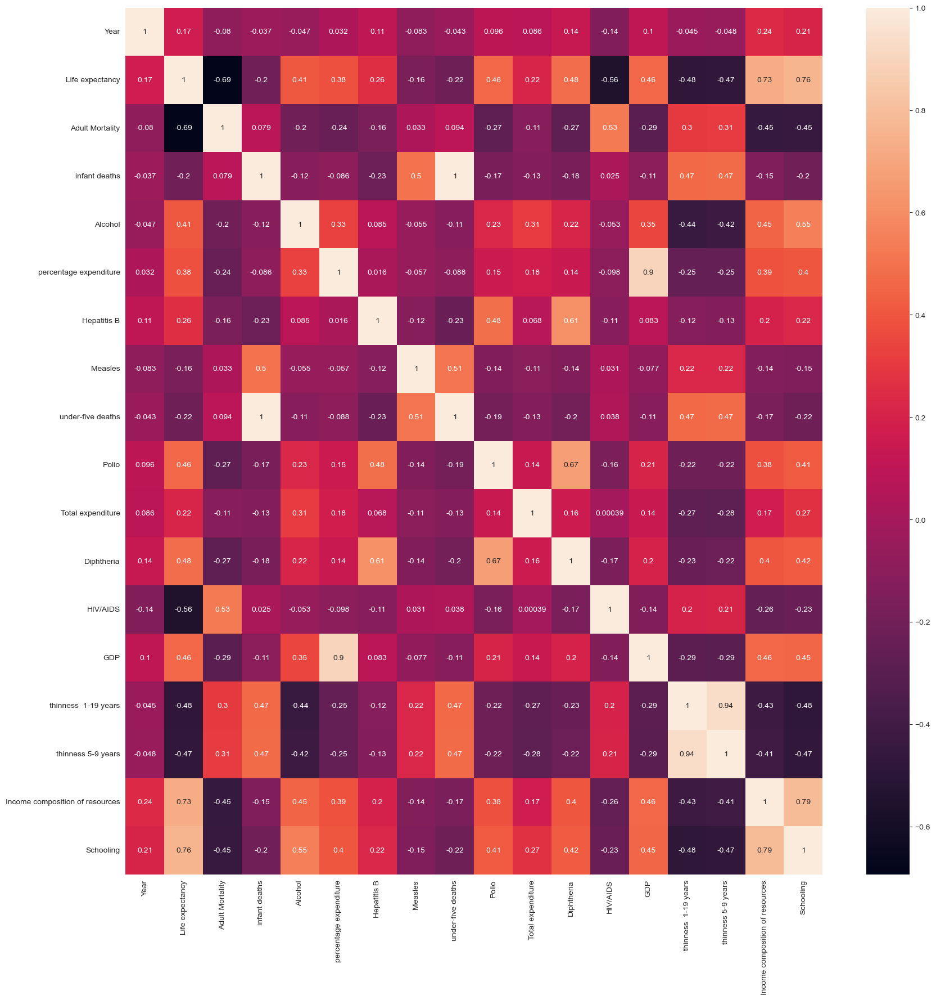

In [19]:
plt.figure(figsize = (20, 20))
sns.heatmap(df.corr(), annot = True)

plt.show()

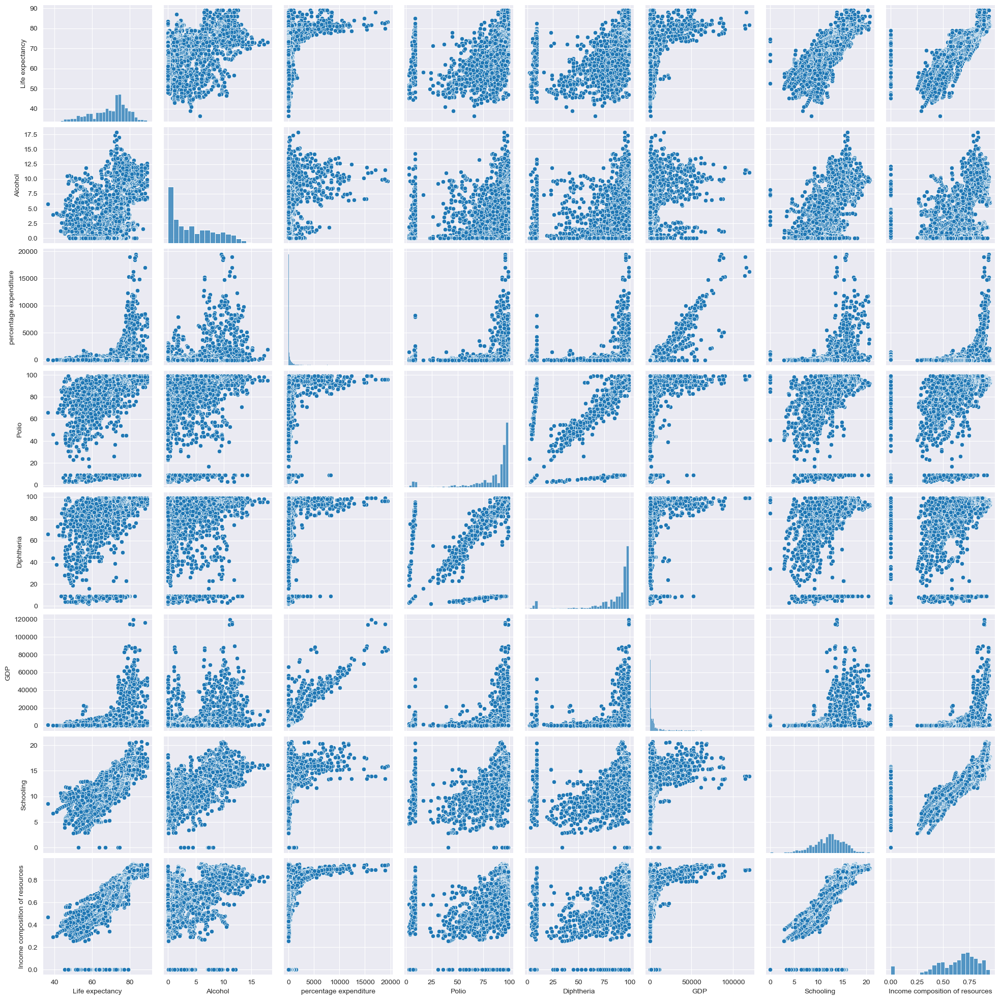

In [20]:
sns.pairplot(df[['Life expectancy', 'Alcohol', 'percentage expenditure', 'Polio', 'Diphtheria', 'GDP', 'Schooling', 'Income composition of resources']])
plt.show()

###### The data is clearly of relatively poor quality but with some clear areas with correlation. There are also areas that have the potential to cause issues with multicolinarity which must be address in our model when predicting life expectancy.

###### We were then given the chance to work with a new dataset that had been cleaned by an outside source but contained roughly the same information.

###### Please find that data, along with a detailed description of the work done on it, [here](https://www.kaggle.com/datasets/lashagoch/life-expectancy-who-updated)

# Exploring the New Dataset

## Eyeball Overview

In [22]:
new = pd.read_csv('Life-Expectancy-Data-Updated.csv')
new.head()

,Country,Region,Year,Infant_deaths,Under_five_deaths,Adult_mortality,Alcohol_consumption,Hepatitis_B,Measles,BMI,...,Diphtheria,Incidents_HIV,GDP_per_capita,Population_mln,Thinness_ten_nineteen_years,Thinness_five_nine_years,Schooling,Economy_status_Developed,Economy_status_Developing,Life_expectancy
0,Turkiye,Middle East,2015,11.1,13.0,105.8240,1.32,97,65,27.8,...,97,0.08,11006,78.53,4.9,4.8,7.8,0,1,76.5
1,Spain,European Union,2015,2.7,3.3,57.9025,10.35,97,94,26.0,...,97,0.09,25742,46.44,0.6,0.5,9.7,1,0,82.8
2,India,Asia,2007,51.5,67.9,201.0765,1.57,60,35,21.2,...,64,0.13,1076,1183.21,27.1,28.0,5.0,0,1,65.4
3,Guyana,South America,2006,32.8,40.5,222.1965,5.68,93,74,25.3,...,93,0.79,4146,0.75,5.7,5.5,7.9,0,1,67.0
4,Israel,Middle East,2012,3.4,4.3,57.9510,2.89,97,89,27.0,...,94,0.08,33995,7.91,1.2,1.1,12.8,1,0,81.7


In [23]:
new.shape

(2864, 21)

In [24]:
new.dtypes

Country                         object
Region                          object
Year                             int64
Infant_deaths                  float64
Under_five_deaths              float64
Adult_mortality                float64
Alcohol_consumption            float64
Hepatitis_B                      int64
Measles                          int64
BMI                            float64
Polio                            int64
Diphtheria                       int64
Incidents_HIV                  float64
GDP_per_capita                   int64
Population_mln                 float64
Thinness_ten_nineteen_years    float64
Thinness_five_nine_years       float64
Schooling                      float64
Economy_status_Developed         int64
Economy_status_Developing        int64
Life_expectancy                float64
dtype: object

In [25]:
new.describe()

,Year,Infant_deaths,Under_five_deaths,Adult_mortality,Alcohol_consumption,Hepatitis_B,Measles,BMI,Polio,Diphtheria,Incidents_HIV,GDP_per_capita,Population_mln,Thinness_ten_nineteen_years,Thinness_five_nine_years,Schooling,Economy_status_Developed,Economy_status_Developing,Life_expectancy
count,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000,2864.000000
mean,2007.500000,30.363792,42.938268,192.251775,4.820882,84.292598,77.344972,25.032926,86.499651,86.271648,0.894288,11540.924930,36.675915,4.865852,4.899825,7.632123,0.206704,0.793296,68.856075
std,4.610577,27.538117,44.569974,114.910281,3.981949,15.995511,18.659693,2.193905,15.080365,15.534225,2.381389,16934.788931,136.485867,4.438234,4.525217,3.171556,0.405012,0.405012,9.405608
min,2000.000000,1.800000,2.300000,49.384000,0.000000,12.000000,10.000000,19.800000,8.000000,16.000000,0.010000,148.000000,0.080000,0.100000,0.100000,1.100000,0.000000,0.000000,39.400000
25%,2003.750000,8.100000,9.675000,106.910250,1.200000,78.000000,64.000000,23.200000,81.000000,81.000000,0.080000,1415.750000,2.097500,1.600000,1.600000,5.100000,0.000000,1.000000,62.700000
50%,2007.500000,19.600000,23.100000,163.841500,4.020000,89.000000,83.000000,25.500000,93.000000,93.000000,0.150000,4217.000000,7.850000,3.300000,3.400000,7.800000,0.000000,1.000000,71.400000
75%,2011.250000,47.350000,66.000000,246.791375,7.777500,96.000000,93.000000,26.400000,97.000000,97.000000,0.460000,12557.000000,23.687500,7.200000,7.300000,10.300000,0.000000,1.000000,75.400000
max,2015.000000,138.100000,224.900000,719.360500,17.870000,99.000000,99.000000,32.100000,99.000000,99.000000,21.680000,112418.000000,1379.860000,27.700000,28.600000,14.100000,1.000000,1.000000,83.800000


## Checking for Nulls

In [26]:
null_df = new.isnull()
null_df.sum()

Country                        0
Region                         0
Year                           0
Infant_deaths                  0
Under_five_deaths              0
Adult_mortality                0
Alcohol_consumption            0
Hepatitis_B                    0
Measles                        0
BMI                            0
Polio                          0
Diphtheria                     0
Incidents_HIV                  0
GDP_per_capita                 0
Population_mln                 0
Thinness_ten_nineteen_years    0
Thinness_five_nine_years       0
Schooling                      0
Economy_status_Developed       0
Economy_status_Developing      0
Life_expectancy                0
dtype: int64

## Checking New Columns

In [27]:
new.Economy_status_Developed.unique()

array([0, 1], dtype=int64)

In [28]:
new.Economy_status_Developing.unique()

array([1, 0], dtype=int64)

## Checking Entries per Country

In [29]:
new.groupby('Country').count()

,Region,Year,Infant_deaths,Under_five_deaths,Adult_mortality,Alcohol_consumption,Hepatitis_B,Measles,BMI,Polio,Diphtheria,Incidents_HIV,GDP_per_capita,Population_mln,Thinness_ten_nineteen_years,Thinness_five_nine_years,Schooling,Economy_status_Developed,Economy_status_Developing,Life_expectancy
Country,,,,,,,,,,,,,,,,,,,,
Afghanistan,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16
Albania,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16
Algeria,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16
Angola,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16
Antigua and Barbuda,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Venezuela, RB",16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16
Vietnam,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16
"Yemen, Rep.",16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16,16


## Correlation

In [30]:
new.corr()

C:\Users\lawre\AppData\Local\Temp\ipykernel_19396\940348085.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  new.corr()


,Year,Infant_deaths,Under_five_deaths,Adult_mortality,Alcohol_consumption,Hepatitis_B,Measles,BMI,Polio,Diphtheria,Incidents_HIV,GDP_per_capita,Population_mln,Thinness_ten_nineteen_years,Thinness_five_nine_years,Schooling,Economy_status_Developed,Economy_status_Developing,Life_expectancy
Year,1.000000e+00,-0.172402,-0.176393,-0.158660,-0.000611,0.176824,0.085945,0.161422,0.139858,0.145143,-0.081743,0.040998,0.015158,-0.044901,-0.048038,0.150539,-5.026601e-15,4.975598e-15,0.174359
Infant_deaths,-1.724017e-01,1.000000,0.985651,0.794661,-0.454526,-0.512562,-0.526282,-0.661988,-0.740790,-0.721875,0.349458,-0.512286,0.007622,0.491192,0.477639,-0.788513,-4.758662e-01,4.758662e-01,-0.920032
Under_five_deaths,-1.763926e-01,0.985651,1.000000,0.802361,-0.409367,-0.507427,-0.512972,-0.665255,-0.742983,-0.725355,0.369618,-0.469682,-0.005234,0.466978,0.450756,-0.773196,-4.271342e-01,4.271342e-01,-0.920419
Adult_mortality,-1.586596e-01,0.794661,0.802361,1.000000,-0.244794,-0.344882,-0.416153,-0.522866,-0.524226,-0.513803,0.699119,-0.510121,-0.053848,0.382140,0.379792,-0.581035,-4.293748e-01,4.293748e-01,-0.945360
Alcohol_consumption,-6.105222e-04,-0.454526,-0.409367,-0.244794,1.000000,0.168436,0.318603,0.284032,0.301926,0.299016,-0.034118,0.443966,-0.039119,-0.446366,-0.433030,0.615728,6.703661e-01,-6.703661e-01,0.399159
Hepatitis_B,1.768241e-01,-0.512562,-0.507427,-0.344882,0.168436,1.000000,0.429168,0.345421,0.724345,0.761780,-0.075782,0.159375,-0.082396,-0.208453,-0.213794,0.347643,1.135340e-01,-1.135340e-01,0.417804
Measles,8.594472e-02,-0.526282,-0.512972,-0.416153,0.318603,0.429168,1.000000,0.416321,0.514096,0.494059,-0.150580,0.313724,-0.098222,-0.340705,-0.366970,0.498391,2.986933e-01,-2.986933e-01,0.490019
BMI,1.614225e-01,-0.661988,-0.665255,-0.522866,0.284032,0.345421,0.416321,1.000000,0.457206,0.426501,-0.161142,0.336180,-0.166482,-0.596483,-0.599112,0.635475,2.432870e-01,-2.432870e-01,0.598423
Polio,1.398584e-01,-0.740790,-0.742983,-0.524226,0.301926,0.724345,0.514096,0.457206,1.000000,0.953178,-0.147952,0.313786,-0.033486,-0.312685,-0.306998,0.552765,2.832601e-01,-2.832601e-01,0.641217
Diphtheria,1.451429e-01,-0.721875,-0.725355,-0.513803,0.299016,0.761780,0.494059,0.426501,0.953178,1.000000,-0.146932,0.313321,-0.027336,-0.304466,-0.295597,0.535621,2.894172e-01,-2.894172e-01,0.627541


C:\Users\lawre\AppData\Local\Temp\ipykernel_19396\943721781.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(new.corr(), annot = True)


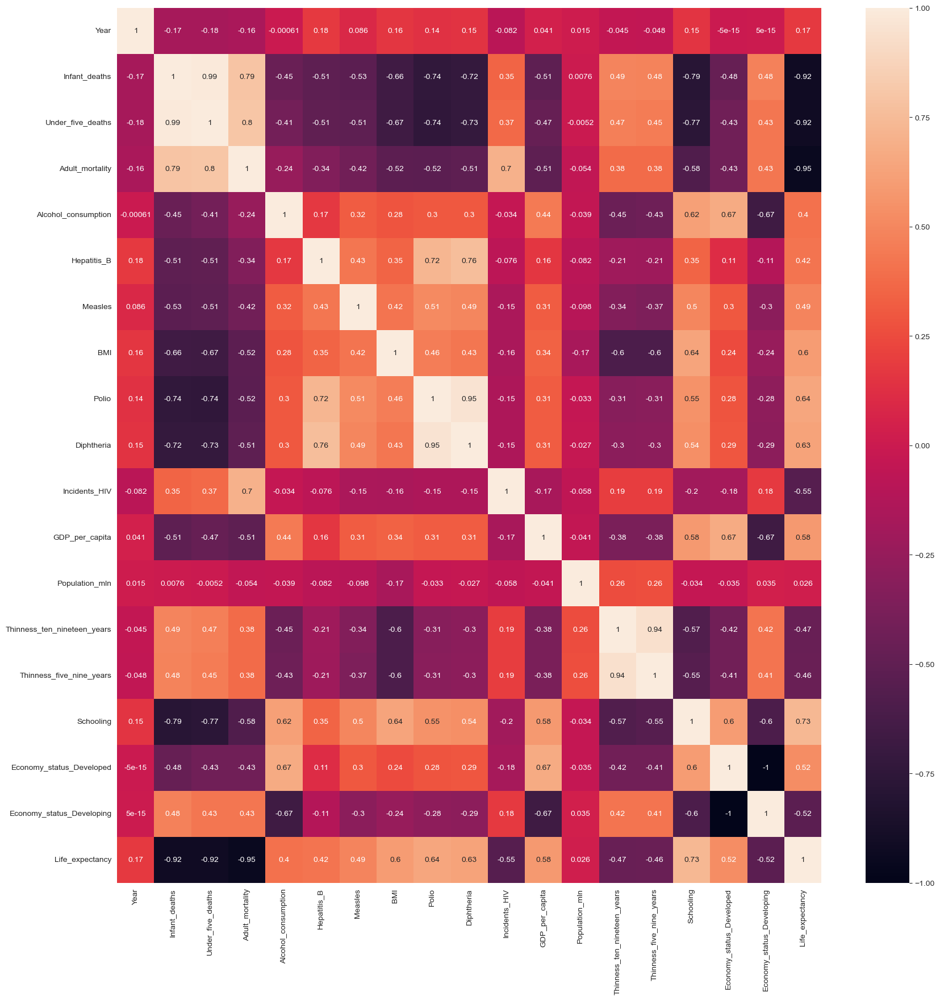

In [31]:
plt.figure(figsize = (20, 20))
sns.heatmap(new.corr(), annot = True)

plt.show()

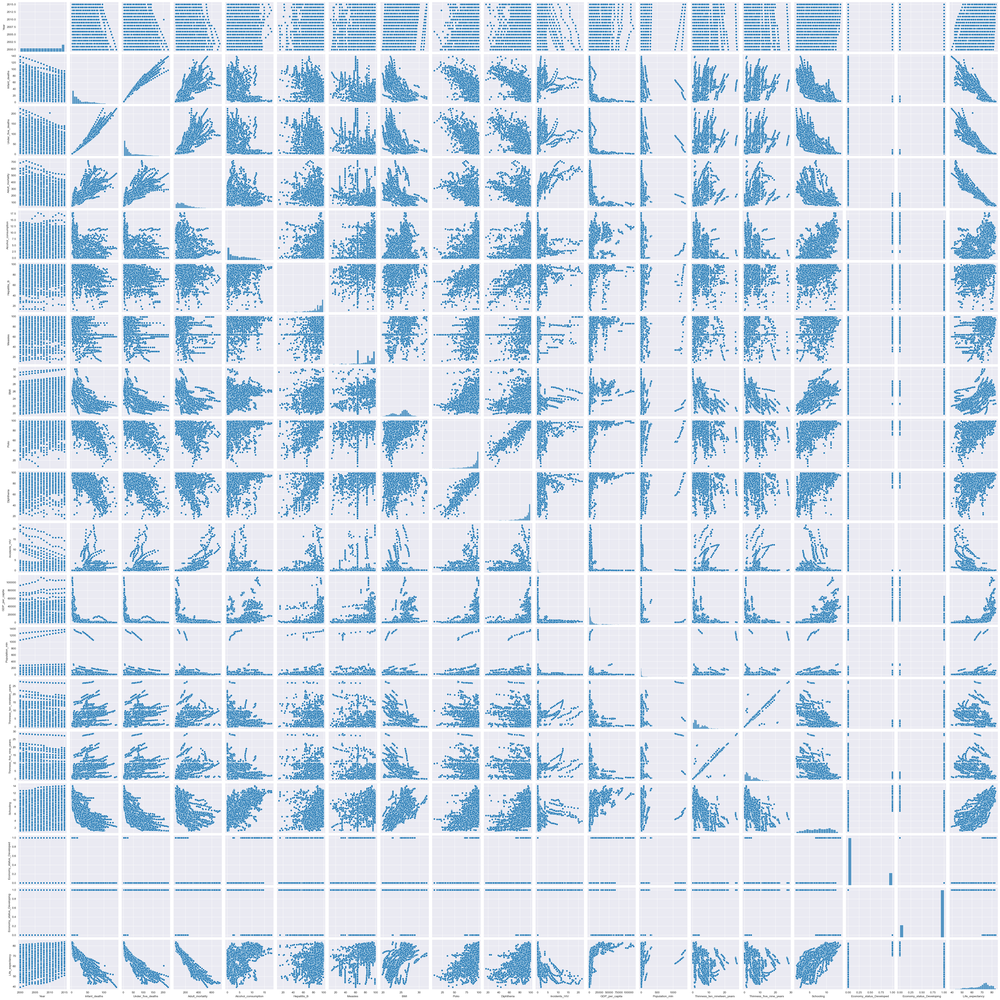

In [32]:
sns.pairplot(new)
plt.show()

###### This dataset is much cleaner and represents some of the things that we could have done further if there was more time available, we shall use this data for our model